# Lane and curvature detection

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
from pylab import *
import os
import pickle
import math
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import glob
from skimage import data, img_as_float
from skimage import exposure

%matplotlib inline

## Camera Caliberation data

In [2]:
try:
    file = open('cam_calib_imgpoints_objpoints.pkl', 'rb')
    imgpoints = pickle.load(file)
    objpoints = pickle.load(file)
except FileNotFoundError:
    print ('please run Camera_calib.ipynb to generate the camera caliberation data.')
    print ('data will be generated in file cam_calib_imgpoints_objpoints.pkl')

In [3]:
#reffered from https://stackoverflow.com/questions/43240604/python-local-normalization-in-opencv

def local_normalize(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    gray,u,v = cv2.split(gray)
    float_gray = gray.astype(np.float32) / 255.0

    blur = cv2.GaussianBlur(float_gray, (0, 0), sigmaX=2, sigmaY=2)
    num = float_gray - blur

    blur = cv2.GaussianBlur(num*num, (0, 0), sigmaX=20, sigmaY=20)
    den = cv2.pow(blur, 0.5)

    gray = num / den

    cv2.normalize(gray, dst=gray, alpha=0.0, beta=1.0, norm_type=cv2.NORM_MINMAX)
    gray = gray*255
    gray = gray.astype(np.uint8)
    yuv = cv2.merge((gray,u,v))
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

   ### 2. Apply a distortion correction to raw images.
      Use the camera caliberation data obtained from cam_calib_imgpoints_objpoints1.pk file to undistort the images.

In [4]:
# TODO: Write a function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2:], None, None)   
    return cv2.undistort(img, mtx, dist, None, mtx)

In [5]:
#function to compare 2 images side by side
def compare_images(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [6]:
#function to compare two images vertically (bigger on appearance)
def compare_images_V(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

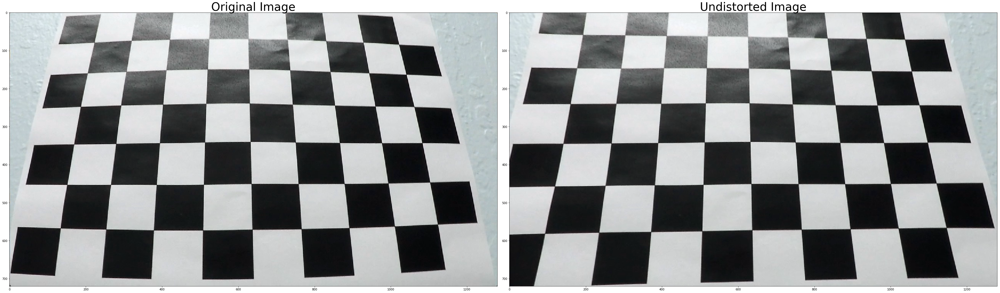

In [7]:
#un-comment the block to check caliberation
img = cv2.imread('camera_cal/calibration3.jpg')
#img = cv2.imread('test_images/test21.jpg')
img = cv2.resize(img, (1280, 720)) 
undistorted = cal_undistort(img, objpoints, imgpoints)

compare_images(img, undistorted, text1 = 'Original Image', text2 = 'Undistorted Image')

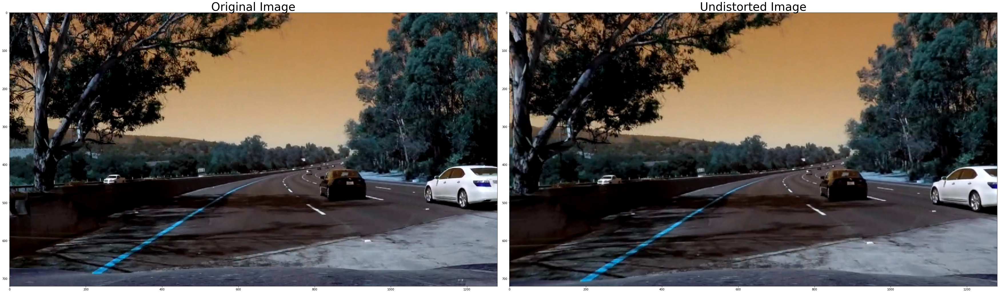

In [8]:
#un-comment the block to check caliberation
#img = cv2.imread('camera_cal/calibration3.jpg')
img = cv2.imread('test_images/test21.jpg')
img = cv2.resize(img, (1280, 720)) 
undistorted = cal_undistort(img, objpoints, imgpoints)

compare_images(img, undistorted, text1 = 'Original Image', text2 = 'Undistorted Image')

In [9]:
def region_of_interest(img):
    """
    Applies an image mask.
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    imshape = img.shape
    vertices = np.array([[(240,720), (240, 10), (1100, 10), (1100, 720)]], dtype=np.int32) #677
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [10]:
def corners_unwarp(img, objpoints, imgpoints):
    """
    this function does the perspective transform and wraps from the image.
    """
    # 1) Undistort using mtx and dist
    undistorted_img = cal_undistort(img, objpoints, imgpoints)
    img_size = img.shape
    shape = (img_size[1], img_size[0])
    
    src = np.array([[487, 528],
                    [803, 528],
                    [245, 684],
                    [1050, 684]], np.float32)

    dst = np.array([[320, 0],
                    [926, 0],
                    [320,720],
                    [920, 720]], np.float32)
    # d)cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    gray = cv2.warpPerspective(undistorted_img, M,  shape, flags = cv2.INTER_LINEAR )
    return region_of_interest(gray)
    return gray

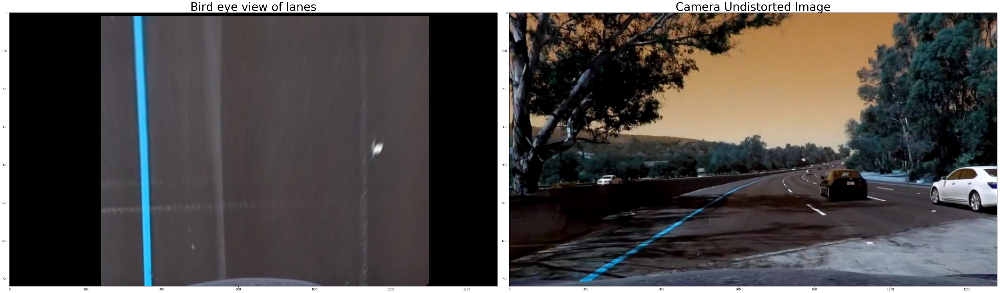

In [11]:
img = cv2.imread('test_images/test11.jpg')
img = cv2.resize(img, (1280, 720)) 

img_unwrap = corners_unwarp(img, objpoints, imgpoints)
compare_images(img_unwrap, undistorted, text1 = 'Bird eye view of lanes', text2 = 'Camera Undistorted Image')

### This function does exactly opposite to the above unwrap function
Src and dst arrays are swaped compared to corners_unwarp()

In [12]:
def corners_warp(undistorted_img, objpoints, imgpoints):

    # 1) Undistort using mtx and dist
    #undistorted_img = cal_undistort(undistorted_img, objpoints, imgpoints)
    img_size = undistorted_img.shape
    shape = (img_size[1], img_size[0])

    dst = np.array([[487, 528],
                    [803, 528],
                    [245, 684],
                    [1050, 684]], np.float32)
    
    src = np.array([[320, 0],
                    [926, 0],
                    [320,720],
                    [920, 720]], np.float32)
    # d)cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    gray = cv2.warpPerspective(undistorted_img, M,  shape, flags = cv2.INTER_LINEAR )
    return region_of_interest(gray)

### Trials


local_normalize

A channel is affected by the shadows

A and B Chanbels are good against any color of the road.L Channel is good for white lines

In [13]:
def pipeline(img, s_thresh=(100, 180), sx_thresh=(25, 80)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(s_binary), s_binary, sxbinary)) * 255
    return color_binary

In [14]:
def modern_pipeline_mix(img):
  
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # define range of blue color in HSV
    lower_white = np.array([0,0,220])
    upper_while = np.array([255,255,255])
    # Threshold the HSV image to get only blue colors
    mask_white = cv2.inRange(hsv, lower_white, upper_while)

    unwraped = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

    L = unwraped[:,:,0]
    A = unwraped[:,:,1]
    B = unwraped[:,:,2]

    binary = np.zeros_like(A)
    binary[(A > 0) & (A <= 123)] = 1
    
    #combine white and yellow lines
    binary1 = np.zeros_like(A)
    binary1[(binary !=0) | (mask_white != 0)] = 255

    return binary1

img = cv2.imread('test_images/test7.jpg')
img = cv2.resize(img, (1280, 720)) 
undistorted = cal_undistort(img, objpoints, imgpoints)
unwraped = corners_unwarp(undistorted, objpoints, imgpoints)


In [15]:
def binary_road(img):
    R, G, B = cv2.split(img)
    b_R = np.zeros_like(R)
    b_G = np.zeros_like(R)
    b_B = np.zeros_like(R)

    #b_R[[(R > 180) & (R <= 255)]] = 1
    b_R[[(R > 230) & (R <= 255)]] = 1
    b_G[[(G > 200) & (G <= 255)]] = 1
    b_B[[(B > 200) & (B <= 255)]] = 1

    #ret2,th2 = cv.threshold(modern_pipeline_mix(img),0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)


    unwraped1 = cv2.merge((b_R, b_G, b_B))*255
    ret2,th2 = cv2.threshold(cv2.cvtColor(unwraped1, cv2.COLOR_RGB2GRAY),0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    #HLS = cv2.cvtColor(unwraped1, cv2.COLOR_RGB2LAB)
    #H,L,S = cv2.split(HLS)
    #compare_images_V(th2, modern_pipeline_mix(img), text1 = 'Y channel', text2 = 'U channel')    
    th2 = th2 | modern_pipeline_mix(img)

    
    return th2

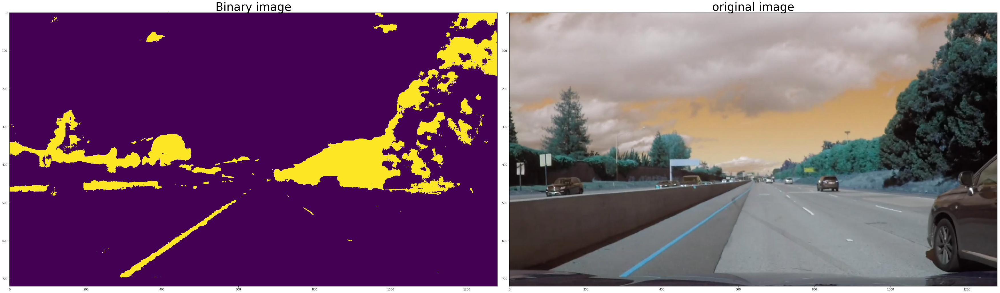

In [16]:
img = cv2.imread('test_images/test10.jpg')
img1 = cv2.resize(img, (1280, 720)) 
#undistorted = cal_undistort(img, objpoints, imgpoints)
#img = cv2.equalizeHist(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))
unwraped = corners_unwarp(undistorted, objpoints, imgpoints)


compare_images((binary_road(img1)), img1, text1 = 'Binary image', text2 = 'original image')


In [17]:

class lines:
    def __init__ (self, new):
        self.found = new
    
    frame_num = 0
    left_fit_buff = np.array([[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]\
                             ,[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]])
    left_fit = np.array([0,0,0])
    #left_fit_buff = np.empty((0,3), int)
    right_fit_buff = np.array([[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]\
                             ,[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]])
    #right_fit_buff = []
    right_fit = np.array([0,0,0])
    leftx = []
    lefty = []
    rightx = []
    righty = []
    

    def find_lane_pixels(self, binary_warped):

        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        
        # Create an output image to draw on and visualize the result
        #out_img = np.dstack((binary_warped, binary_warped, binary_warped))


        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]//2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint
        print ('approx distance:' ,rightx_base - leftx_base)
        #print (histogram[midpoint:])
        from scipy.signal import find_peaks_cwt
        
        indexes = find_peaks_cwt(histogram, np.arange(1, 1920))
        print ('indexes', indexes)
        print ('leftx_base',leftx_base)
        print ('rightx_base', rightx_base)
        #rightx_base =  (rightx_base + leftx_base + 550)//2
        rightx_base =  525 + leftx_base
        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 50
        # Set minimum number of pixels found to recenter window
        minpix = 20

        # Set height of windows - based on nwindows above and image shape
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated later for each window in nwindows
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            #print (win_xright_low, win_xright_high)

            #Draw the windows on the visualization image
            
            
            #uncommend this block for debug. it prints windows on the frames.
            cv2.rectangle(binary_warped,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(255,255,255), 2) 
            cv2.rectangle(binary_warped,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(255,255,255), 2)
            
            
            
            
            # Identify the nonzero pixels in x and y within the window #
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds])) 
            if len(good_right_inds) > minpix :#and len(good_right_inds) < minpix+30:        
                rx = np.int(np.mean(nonzerox[good_right_inds]))
                rightx_current = math.floor(0.75*rx) + math.floor(0.25*(leftx_current+540))
            else:
                rightx_current = math.floor(self.right_fit[0]*450**2 + self.right_fit[1]*450 + self.right_fit[2])

        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            print ('left_lane_inds',left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
            print ('right_lane_inds',right_lane_inds)
        except ValueError:
            #print ("got ")
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        if np.sum(left_lane_inds, axis = 0) > 10000:
            self.found = 1
            self.leftx = nonzerox[left_lane_inds]
            self.lefty = nonzeroy[left_lane_inds]
            
        if np.sum(right_lane_inds, axis = 0) > 1000:
            self.found = 1
            self.rightx = nonzerox[right_lane_inds]
            self.righty = nonzeroy[right_lane_inds]
        
        self.found = (np.sum(left_lane_inds, axis = 0) > 10000) and (np.sum(right_lane_inds, axis = 0) > 1000)

        
        #try:
            #self.left_fit_buff[self.frame_num%10] =  np.polyfit(self.lefty, self.leftx, 2)
            #self.right_fit_buff[self.frame_num%10] = np.polyfit(self.righty, self.rightx, 2)           
            
            #self.left_fit =  np.polyfit(self.lefty, self.leftx, 2)
            #self.right_fit = np.polyfit(self.righty, self.rightx, 2)
        #except:
            #pass
        compare_images(binary_warped, binary_warped, text1 = 'windows', text2 = 'windows')
        return 
    
    # Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!


    def fit_poly(self,img_shape):
        indx = self.frame_num%10
        avg = 0
        
        if self.frame_num < 10:
            avg = self.frame_num
        else:
            avg = 10
        
         ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
        try:
            self.left_fit_buff[indx] =   np.polyfit(self.lefty, self.leftx, 2)
            self.left_fit = np.sum(self.left_fit_buff, axis = 0)/avg
            print ('left avg is: ', np.sum(self.left_fit_buff, axis = 0)/avg, 'adding: ', np.polyfit(self.lefty, self.leftx, 2))
        except:
            pass
        
        
        try:
            self.right_fit_buff[indx] =  np.polyfit(self.righty, self.rightx, 2)
            self.right_fit = np.sum(self.right_fit_buff, axis = 0)/avg
            print ('right avg is: ', np.sum(self.right_fit_buff, axis = 0)/avg, 'adding: ',np.polyfit(self.righty, self.rightx, 2))

        except:
            pass
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
        ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
        left_fitx = self.left_fit[0]*ploty**2 + self.left_fit[1]*ploty + self.left_fit[2]
        right_fitx = self.right_fit[0]*ploty**2 + self.right_fit[1]*ploty + self.right_fit[2]
        return left_fitx, right_fitx, ploty
    
    def find_cruve(self, left_fitx, right_fitx, ploty, shape1):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 8/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/650 # meters per pixel in x dimension
        
        
        left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
        
        l = self.left_fit[0]*shape1[0]**2 + self.left_fit[1]*shape1[0] + self.left_fit[2]
        r = self.right_fit[0]*shape1[0]**2 + self.right_fit[1]*shape1[0] + self.right_fit[2]
        
        lane_center = (r+l)/2
        car_center = shape1[1]/2
        deviation = (car_center - lane_center)*xm_per_pix
        
        
        # We'll choose the maximum y-value, corresponding to the bottom of the image
        y_eval = np.max(ploty)
        
        # Calculation of R_curve (radius of curvature)
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        curve = (left_curverad + right_curverad)/2
        #sto = 'curve is' + str(curve)
        #print ('curve is',sto)
        return curve, deviation
        
    def search_around_poly(self, binary_warped):
        ploty = np.linspace(0, binary_warped.shape[0]-1,  binary_warped.shape[0])
        l_confident = 0
        r_confident = 0
        shape1 = binary_warped.shape
        self.frame_num = self.frame_num + 1
        
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        
        window_img = np.zeros_like(out_img)
        # HYPERPARAMETER
        # Choose the width of the margin around the previous polynomial to search
        # The quiz grader expects 100 here, but feel free to tune on your own!
        margin = 60
        #find out the lane pixels from the binary image
        nonzero = binary_warped.nonzero()
        #y coordinates of the lane pixes
        nonzeroy = np.array(nonzero[0])
        #x coordinates of the lane pixels
        nonzerox = np.array(nonzero[1])
        
        #if this is new start, and lanes were never detected, use histogram 
        #i.e. window search methode to detect the lanes
        if self.found == 0:
            self.find_lane_pixels(binary_warped)
            left_fitx, right_fitx, ploty = self.fit_poly(shape1)
        else:
     
            #Use the lane fits (left_fit & right_fit) to see if the above detected non-zero pixels are 
            #in range of 'margin' on both left and right side of each lane. 
            left_lane_inds = ((nonzerox > (self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + 
                            self.left_fit[2] - margin)) & (nonzerox < (self.left_fit[0]*(nonzeroy**2) + 
                            self.left_fit[1]*nonzeroy + self.left_fit[2] + margin)))
            right_lane_inds = ((nonzerox > (self.right_fit[0]*(nonzeroy**2) + self.right_fit[1]*nonzeroy + 
                            self.right_fit[2] - margin)) & (nonzerox < (self.right_fit[0]*(nonzeroy**2) + 
                            self.right_fit[1]*nonzeroy + self.right_fit[2] + margin)))

            # Again, extract left and right line pixel positions
            #Since in all the data set, the lane always had solid lane (yellow or white) the number of
            #pixels detected were usually more than 10000. hence using it as a minimum threshold for left
            #lane. If pixels detected are more than 10000, only then replace the pixels detected from the
            #previous frame, or else keep the pixels from the previous frame
            if np.sum(left_lane_inds, axis = 0) > 10000:
                self.leftx = nonzerox[left_lane_inds]
                self.lefty = nonzeroy[left_lane_inds]
                
                l_confident = 1
            else:
                print ('left not confident',np.sum(left_lane_inds, axis = 0))
                self.found = 0

            # Same as above. But since the right lane was usually not solid, minimum pixels or threshold was 
            #set to 1000. rest is same as explained above.

            if np.sum(right_lane_inds, axis = 0) > 1000:
                print (np.sum(right_lane_inds, axis = 0))
                self.rightx = nonzerox[right_lane_inds]
                self.righty = nonzeroy[right_lane_inds]
                r_confident = 1

            else:
                print ('right not confident', np.sum(right_lane_inds, axis = 0))
                self.found = 0
            
        #use the above detected left and right lane pixes (leftx, rightx, lefty, righty) to plot
        #a polynomial curve of order 2, and obtain it's pixels in the form of arrays. ploty is just all
        #the pixels for vertical order, i.e. 0 to hight of the image i.e. 720 here.
            left_fitx, right_fitx, ploty = self.fit_poly(shape1)
        
        lt = self.left_fit[0]*30**2 + self.left_fit[1]*30 + self.left_fit[2]
        rt = self.right_fit[0]*30**2 + self.right_fit[1]*30 + self.right_fit[2]
        
        print ('lane width at top : ', rt-lt, 'center of top is', (rt+lt)/2)
        
        lb = self.left_fit[0]*650**2 + self.left_fit[1]*650 + self.left_fit[2]
        rb = self.right_fit[0]*650**2 + self.right_fit[1]*650 + self.right_fit[2]
        
        print ('lane width at bottom: ', rb-lb, 'center is', (rb+lb)/2)
        
        #if lane width at top and bottom is different then the lines are not parallel 
        if abs((rb-lb) - (rt-lt)) > 60:
            
            right_fit1 = np.polyfit(self.lefty, self.leftx+550, 2)
            right_fitx = right_fit1[0]*ploty**2 + right_fit1[1]*ploty + right_fit1[2]
            
                        #Use the lane fits (left_fit & right_fit) to see if the above detected non-zero pixels are 
            #in range of 'margin' on both left and right side of each lane. 
            left_lane_inds = ((nonzerox > (self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + 
                            self.left_fit[2] - margin)) & (nonzerox < (self.left_fit[0]*(nonzeroy**2) + 
                            self.left_fit[1]*nonzeroy + self.left_fit[2] + margin)))
            right_lane_inds = ((nonzerox > (right_fit1[0]*(nonzeroy**2) + right_fit1[1]*nonzeroy + 
                            right_fit1[2] - margin)) & (nonzerox < (right_fit1[0]*(nonzeroy**2) + 
                            right_fit1[1]*nonzeroy + right_fit1[2] + margin)))

            # Again, extract left and right line pixel positions
            #Since in all the data set, the lane always had solid lane (yellow or white) the number of
            #pixels detected were usually more than 10000. hence using it as a minimum threshold for left
            #lane. If pixels detected are more than 10000, only then replace the pixels detected from the
            #previous frame, or else keep the pixels from the previous frame
            if np.sum(left_lane_inds, axis = 0) > 10000:
                self.leftx = nonzerox[left_lane_inds]
                self.lefty = nonzeroy[left_lane_inds]
                
                l_confident = 1
            else:
                print ('left not confident',np.sum(left_lane_inds, axis = 0))
                self.found = 0

            # Same as above. But since the right lane was usually not solid, minimum pixels or threshold was 
            #set to 1000. rest is same as explained above.

            if np.sum(right_lane_inds, axis = 0) > 1000:
                print (np.sum(right_lane_inds, axis = 0))
                self.rightx = nonzerox[right_lane_inds]
                self.righty = nonzeroy[right_lane_inds]
                self.right_fit_buff[self.frame_num %10] =  np.polyfit(self.righty, self.rightx, 2)
                avg = 10
                if self.frame_num < 10:
                    avg = self.frame_num
                self.right_fit = np.sum(self.right_fit_buff, axis = 0)/avg
                r_confident = 1

            else:
                print ('right not confident', np.sum(right_lane_inds, axis = 0))
                self.found = 0
            
        #use the above detected left and right lane pixes (leftx, rightx, lefty, righty) to plot
        #a polynomial curve of order 2, and obtain it's pixels in the form of arrays. ploty is just all
        #the pixels for vertical order, i.e. 0 to hight of the image i.e. 720 here.
            left_fitx, right_fitx, ploty = self.fit_poly(shape1)
            
 
        
        # re-arrange/shape the arrays detected above to use them for drawing cv2.polylines. 
        left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        #use both the lines, to describe the entire lane area (rectagle)
        fill_lane = np.hstack((left_line, right_line))
        
        # Draw the polynomial lines onto the image, and highlight the detected lane
        cv2.polylines(out_img, np.int32([left_line]), isClosed=False, color=(255,255,0), thickness=5)
        cv2.polylines(out_img, np.int32([right_line]), isClosed=False, color=(0,255,255), thickness=5)
        cv2.fillPoly(out_img, np.int_([fill_lane]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.5, 0)
        
        #find the curvature of the lane and the deviatation of the car from the center 
        #of the lane
        curve, deviation = self.find_cruve(left_fitx, right_fitx, ploty, shape1)
        
        #create strings to paste on the video frame, describing the curvature and deviation of the lanes
        curve = round(curve,3)
        deviation = round(deviation, 3)
        curv_str = 'Curve is ' + str(curve) + 'm'
        if deviation > 0 :
            dev_str = 'Deviation  is ' + str(abs(deviation)) + 'm right of center'
        else:
            dev_str = 'Deviation  is ' + str(abs(deviation)) + 'm left of center'
        
        l_confident = 0
        r_confident = 0
        
        return result, curv_str, dev_str


approx distance: 570
indexes [314 912 973]
leftx_base 297
rightx_base 867
left_lane_inds [89476 89477 89478 ...,  6929  6930  6931]
right_lane_inds [89533 89534 89535 ...,  6952  6953  6954]
left avg is:  [ -4.44974376e-05   7.43990093e-02   2.85685622e+02] adding:  [ -4.44974376e-05   7.43990093e-02   2.85685622e+02]
right avg is:  [ -4.31643630e-05   1.39837338e-02   8.74006181e+02] adding:  [ -4.31643630e-05   1.39837338e-02   8.74006181e+02]
lane width at top :  586.50930058 center of top is 581.132194844
lane width at bottom:  549.613854025 center is 590.051737609
(720, 1280, 3)
(720, 1280, 3)


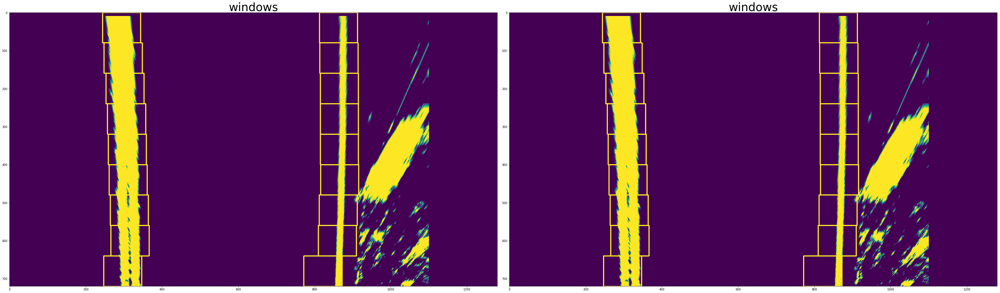

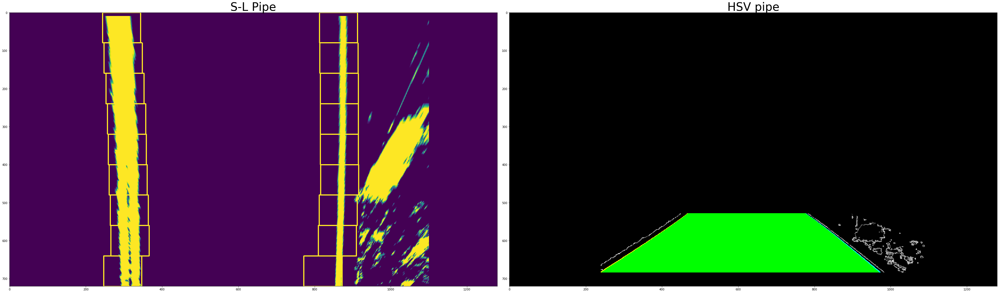

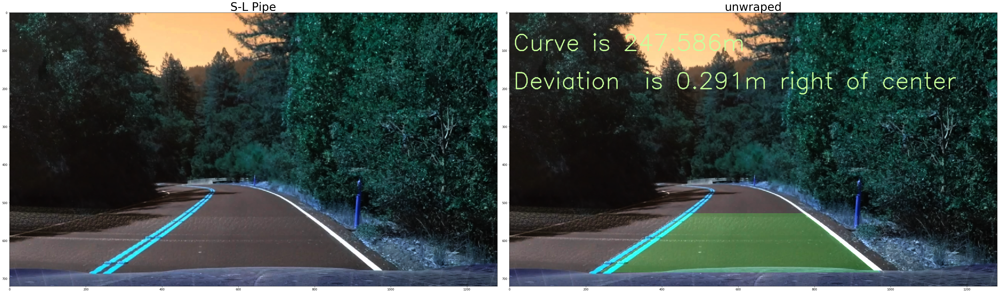

In [18]:


lanes3 = lines(0)
res_1 = cv2.imread('test_images/h_test10.jpg')

image = cv2.resize(res_1, (1280, 720))

#unwraped = corners_unwarp(image, objpoints, imgpoints)
image = exposure.adjust_gamma(image, 2)
res22 = binary_road(image)
#res2 = np.dstack((res2, res2, res2))
res2 = corners_unwarp(res22, objpoints, imgpoints)
res11, c,d = lanes3.search_around_poly(res2)
res1 = corners_warp(res11, objpoints, imgpoints)
compare_images(res2, res1, text1 = 'S-L Pipe', text2 = 'HSV pipe')
print (image.shape)
print (res1.shape)
result = cv2.addWeighted(image, 1, res1, 0.2, 0)
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(result, c,(10,100), font, 2, (200,255,155), 2, cv2.LINE_AA)
cv2.putText(result, d,(10,200), font, 2, (200,255,155), 2, cv2.LINE_AA)



compare_images(image, result, text1 = 'S-L Pipe', text2 = 'unwraped')



In [19]:

"""
lanes = lines(0)

temp = 1

def process_image(image):
    if temp == 1:
        image = cv2.resize(image, (1280, 720))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        #unwraped = corners_unwarp(image, objpoints, imgpoints)
        image = exposure.adjust_gamma(image, 0.7)
        res2 = binary_road(image)
        #res2 = np.dstack((res2, res2, res2))
        res2 = corners_unwarp(res2, objpoints, imgpoints)
        res1, c,d = lanes.search_around_poly(res2)
        res1 = corners_warp(res1, objpoints, imgpoints)
        result = cv2.addWeighted(image, 1, res1, 0.2, 0)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, c,(10,100), font, 2, (200,255,155), 2, cv2.LINE_AA)
        cv2.putText(result, d,(10,200), font, 2, (200,255,155), 2, cv2.LINE_AA)
        
        
        
    else:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        #unwraped = corners_unwarp(image, objpoints, imgpoints)
        image = exposure.adjust_gamma(image, 2)
        result = binary_road(image)
        result = np.dstack((result, result, result))
    return result

white_output = 'submission_challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,1)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)
"""

'\nlanes = lines(0)\n\ntemp = 1\n\ndef process_image(image):\n    if temp == 1:\n        image = cv2.resize(image, (1280, 720))\n        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)\n        #unwraped = corners_unwarp(image, objpoints, imgpoints)\n        image = exposure.adjust_gamma(image, 0.7)\n        res2 = binary_road(image)\n        #res2 = np.dstack((res2, res2, res2))\n        res2 = corners_unwarp(res2, objpoints, imgpoints)\n        res1, c,d = lanes.search_around_poly(res2)\n        res1 = corners_warp(res1, objpoints, imgpoints)\n        result = cv2.addWeighted(image, 1, res1, 0.2, 0)\n        font = cv2.FONT_HERSHEY_SIMPLEX\n        cv2.putText(result, c,(10,100), font, 2, (200,255,155), 2, cv2.LINE_AA)\n        cv2.putText(result, d,(10,200), font, 2, (200,255,155), 2, cv2.LINE_AA)\n        \n        \n        \n    else:\n        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)\n        #unwraped = corners_unwarp(image, objpoints, imgpoints)\n        image = exposure.a

approx distance: 691
indexes [ 339 1090]
leftx_base 337
rightx_base 1028
left_lane_inds [107568 107569 107570 ...,  13405  13406  13407]
right_lane_inds [107597 107598 107599 ...,  13431  13432  13433]
left avg is:  [  3.00311041e-05   8.13046745e-02   2.83192439e+02] adding:  [  3.00311041e-05   8.13046745e-02   2.83192439e+02]
right avg is:  [  1.04759072e-04  -1.44409909e-02   8.51255208e+02] adding:  [  1.04759072e-04  -1.44409909e-02   8.51255208e+02]
lane width at top :  565.257654144 center of top is 568.287434287
lane width at bottom:  537.400652804 center is 617.428945308
[MoviePy] >>>> Building video 1harder_challenge_video.mp4
[MoviePy] Writing video 1harder_challenge_video.mp4


  0%|                                                                                           | 0/51 [00:00<?, ?it/s]

17767
left avg is:  [  2.98194034e-05   8.15187489e-02   2.83108145e+02] adding:  [  2.96077027e-05   8.17328233e-02   2.83023851e+02]
right avg is:  [  1.04759072e-04  -1.44409909e-02   8.51255208e+02] adding:  [  1.04759072e-04  -1.44409909e-02   8.51255208e+02]
lane width at top :  565.33571657 center of top is 568.248403074
lane width at bottom:  537.435242125 center is 617.411650647


  2%|█▋                                                                                 | 1/51 [00:01<01:09,  1.38s/it]

17520
left avg is:  [  2.63829239e-05   8.07938551e-02   2.85453207e+02] adding:  [  1.95099648e-05   7.93440675e-02   2.90143332e+02]
right avg is:  [  1.07971645e-04  -2.20909979e-02   8.55661913e+02] adding:  [  1.14396792e-04  -3.73910120e-02   8.64475322e+02]
lane width at top :  567.19558969 center of top is 571.498562369
lane width at bottom:  537.804785734 center is 618.018391259


  4%|███▎                                                                               | 2/51 [00:02<01:07,  1.37s/it]

17515
left avg is:  [  2.20405024e-05   7.95823989e-02   2.88431812e+02] adding:  [  9.01323786e-06   7.59480304e-02   2.97367625e+02]
right avg is:  [  1.11403115e-04  -3.12968975e-02   8.61161820e+02] adding:  [  1.21697525e-04  -5.89145964e-02   8.77661544e+02]
lane width at top :  569.484056365 center of top is 575.581148188
lane width at bottom:  538.414170068 center is 618.679568176


  6%|████▉                                                                              | 3/51 [00:04<01:05,  1.37s/it]

17388
left avg is:  [  1.98865878e-05   7.68208514e-02   2.91711517e+02] adding:  [  1.12709295e-05   6.57746614e-02   3.04830341e+02]
right avg is:  [  1.16081091e-04  -4.22255517e-02   8.67185277e+02] adding:  [  1.34792995e-04  -8.59401681e-02   8.91279101e+02]
lane width at top :  571.988942241 center of top is 580.028512
lane width at bottom:  538.735774941 center is 619.415041651


  8%|██████▌                                                                            | 4/51 [00:05<01:04,  1.37s/it]

17273
left avg is:  [  1.99634633e-05   7.28256518e-02   2.95022148e+02] adding:  [  2.03478408e-05   5.28496539e-02   3.11575301e+02]
right avg is:  [  1.21312287e-04  -5.39723312e-02   8.73511312e+02] adding:  [  1.47468265e-04  -1.12706229e-01   9.05141488e+02]
lane width at top :  574.776438404 center of top is 584.613103888
lane width at bottom:  538.890352893 center is 620.238561405


 10%|████████▏                                                                          | 5/51 [00:06<01:02,  1.37s/it]

17160
left avg is:  [  2.24565028e-05   6.68605635e-02   2.98823100e+02] adding:  [  3.74147399e-05   3.10700337e-02   3.21628811e+02]
right avg is:  [  1.28350180e-04  -6.73233926e-02   8.80030001e+02] adding:  [  1.70577542e-04  -1.47429761e-01   9.19142132e+02]
lane width at top :  577.276686249 center of top is 589.487470763
lane width at bottom:  538.727407882 center is 621.134042554


 12%|█████████▊                                                                         | 6/51 [00:08<01:01,  1.37s/it]

16734
left avg is:  [  2.26829429e-05   6.27647724e-02   3.02281488e+02] adding:  [  2.42680235e-05   3.40942346e-02   3.26490205e+02]
right avg is:  [  1.34581425e-04  -8.02459505e-02   8.86532972e+02] adding:  [  1.78200137e-04  -1.70703856e-01   9.32053770e+02]
lane width at top :  580.061870591 center of top is 594.21578119
lane width at bottom:  538.571622428 center is 621.947944735


 14%|███████████▍                                                                       | 7/51 [00:09<01:00,  1.38s/it]

16052
left avg is:  [  2.26488139e-05   5.88752299e-02   3.05612372e+02] adding:  [  2.23757821e-05   2.77588894e-02   3.32259443e+02]
right avg is:  [  1.39859908e-04  -9.24530785e-02   8.92923091e+02] adding:  [  1.82087772e-04  -1.90110103e-01   9.44044043e+02]
lane width at top :  582.876359504 center of top is 598.837192551
lane width at bottom:  538.469005573 center is 622.684898047


 16%|█████████████                                                                      | 8/51 [00:11<00:59,  1.38s/it]

15207
left avg is:  [  2.24825791e-05   5.52218283e-02   3.08875951e+02] adding:  [  2.09864657e-05   2.23412142e-02   3.38248162e+02]
right avg is:  [  1.45160323e-04  -1.04626155e-01   8.99221165e+02] adding:  [  1.92864059e-04  -2.14183848e-01   9.55903838e+02]
lane width at top :  585.660184943 center of top is 603.382932618
lane width at bottom:  538.275371909 center is 623.406714989


 18%|██████████████▋                                                                    | 9/51 [00:12<00:57,  1.38s/it]

14071
left avg is:  [  2.27604051e-05   4.80696440e-02   3.14882545e+02] adding:  [  3.28093643e-05   9.78283148e-03   3.43258379e+02]
right avg is:  [  1.54014874e-04  -1.26165221e-01   9.10842036e+02] adding:  [  1.93304580e-04  -2.29831648e-01   9.67463913e+02]
lane width at top :  590.850573994 center of top is 611.770405697
lane width at bottom:  538.161841652 center is 624.825005597


 20%|████████████████                                                                  | 10/51 [00:13<00:56,  1.38s/it]

13698
left avg is:  [  2.60099633e-05   3.76930832e-02   3.21723165e+02] adding:  [  6.21032848e-05  -2.20327846e-02   3.51430049e+02]
right avg is:  [  1.63110734e-04  -1.49687126e-01   9.23809713e+02] adding:  [  1.95717677e-04  -2.49660036e-01   9.80931978e+02]
lane width at top :  596.588532588 center of top is 621.171632563
lane width at bottom:  538.214488204 center is 626.320122495


 22%|█████████████████▋                                                                | 11/51 [00:15<00:54,  1.37s/it]

13365
left avg is:  [  3.01967743e-05   2.68623330e-02   3.28379476e+02] adding:  [  6.13780747e-05  -2.89634344e-02   3.56706441e+02]
right avg is:  [  1.71660327e-04  -1.72993970e-01   9.36838968e+02] adding:  [  1.99892718e-04  -2.70459454e-01   9.94767873e+02]
lane width at top :  602.591120363 center of top is 630.508083019
lane width at bottom:  538.321246419 center is 627.758752567
13133
left avg is:  [  3.18778994e-05   2.52590966e-02   3.28739986e+02] adding:  [  7.81893251e-05  -4.49957981e-02   3.60311545e+02]
right avg is:  [  1.72351990e-04  -1.73687031e-01   9.37000779e+02] adding:  [  2.06809347e-04  -2.77390070e-01   9.96385980e+02]


 24%|███████████████████▎                                                              | 12/51 [00:16<00:53,  1.38s/it]

13008
left avg is:  [  3.76017013e-05   1.32950671e-02   3.35322887e+02] adding:  [  6.62512571e-05  -4.36922654e-02   3.63196637e+02]
right avg is:  [  1.80859408e-04  -1.97292935e-01   9.50141587e+02] adding:  [  2.06771707e-04  -2.94973629e-01   1.00906962e+03]
lane width at top :  608.62999112 center of top is 640.070576387
lane width at bottom:  538.462879249 center is 629.082839291
12282
left avg is:  [  3.92288667e-05   1.17449890e-02   3.35675770e+02] adding:  [  8.25229112e-05  -5.91930458e-02   3.66725462e+02]
right avg is:  [  1.81153271e-04  -1.97529541e-01   9.50176984e+02] adding:  [  2.09710332e-04  -2.97339693e-01   1.00942360e+03]


 25%|████████████████████▉                                                             | 13/51 [00:18<00:52,  1.38s/it]

12753
left avg is:  [  4.42408486e-05   1.18017401e-04   3.42113194e+02] adding:  [  6.13907488e-05  -5.04950548e-02   3.69204587e+02]
right avg is:  [  1.88780213e-04  -2.20700996e-01   9.63378896e+02] adding:  [  2.11062423e-04  -3.17654718e-01   1.02329822e+03]
lane width at top :  614.771216359 center of top is 649.542159885
lane width at bottom:  538.801224157 center is 630.28227635
11612
left avg is:  [  4.57123308e-05  -1.35816498e-03   3.42479313e+02] adding:  [  7.61055702e-05  -6.52568786e-02   3.72865771e+02]
right avg is:  [  1.89445249e-04  -2.21245734e-01   9.63463659e+02] adding:  [  2.17712781e-04  -3.23102098e-01   1.02414584e+03]


 27%|██████████████████████▌                                                           | 14/51 [00:19<00:51,  1.39s/it]

12401
left avg is:  [  5.15150315e-05  -1.39089745e-02   3.49010479e+02] adding:  [  7.83748485e-05  -7.26584410e-02   3.76886964e+02]
right avg is:  [  1.96431371e-04  -2.44148723e-01   9.76767225e+02] adding:  [  2.17329487e-04  -3.41736113e-01   1.03817715e+03]
lane width at top :  620.979977755 center of top is 659.129562316
lane width at bottom:  539.328062829 center is 631.398777973
10970
left avg is:  [  5.30004941e-05  -1.54223948e-02   3.49388171e+02] adding:  [  9.32294737e-05  -8.77926446e-02   3.80663880e+02]
right avg is:  [  1.96178706e-04  -2.43721088e-01   9.76605874e+02] adding:  [  2.14802828e-04  -3.37459770e-01   1.03656365e+03]


 29%|████████████████████████                                                          | 15/51 [00:21<00:50,  1.40s/it]

12215
left avg is:  [  5.66062545e-05  -2.59986368e-02   3.55234498e+02] adding:  [  7.34723447e-05  -7.46923858e-02   3.80092083e+02]
right avg is:  [  2.00750233e-04  -2.64849119e-01   9.89844622e+02] adding:  [  2.16292817e-04  -3.58710066e-01   1.05152961e+03]
lane width at top :  627.574338962 center of top is 668.292653973
lane width at bottom:  540.258141457 center is 632.380597333
10253
left avg is:  [  5.81814719e-05  -2.75070965e-02   3.55573854e+02] adding:  [  8.92245183e-05  -8.97769828e-02   3.83485643e+02]
right avg is:  [  1.99790784e-04  -2.63558236e-01   9.89425333e+02] adding:  [  2.06698326e-04  -3.45801237e-01   1.04733672e+03]


 31%|█████████████████████████▋                                                        | 16/51 [00:22<00:49,  1.41s/it]

11967
left avg is:  [  6.45531013e-05  -4.04804501e-02   3.61640858e+02] adding:  [  8.79843178e-05  -9.56393016e-02   3.87160249e+02]
right avg is:  [  2.03155192e-04  -2.83668223e-01   1.00262930e+03] adding:  [  2.11844214e-04  -3.71803729e-01   1.06409345e+03]
lane width at top :  633.817551742 center of top is 677.393318587
lane width at bottom:  541.475773699 center is 633.340138015
9489
left avg is:  [  6.63259262e-05  -4.21888520e-02   3.62025527e+02] adding:  [  1.05712567e-04  -1.12723320e-01   3.91006931e+02]
right avg is:  [  2.01785674e-04  -2.81776926e-01   1.00199933e+03] adding:  [  1.98149040e-04  -3.52890756e-01   1.05779375e+03]


 33%|███████████████████████████▎                                                      | 17/51 [00:23<00:47,  1.41s/it]

11684
left avg is:  [  7.34489865e-05  -5.62709817e-02   3.68300724e+02] adding:  [  9.36063844e-05  -1.13062408e-01   3.95011420e+02]
right avg is:  [  2.04549080e-04  -3.01489487e-01   1.01530226e+03] adding:  [  2.09721831e-04  -3.87235718e-01   1.07707332e+03]
lane width at top :  639.762969475 center of top is 686.56018367
lane width at bottom:  542.999295331 center is 634.256430658
8901
left avg is:  [  7.53572472e-05  -5.81041647e-02   3.68709174e+02] adding:  [  1.12688992e-04  -1.31394238e-01   3.99095919e+02]
right avg is:  [  2.03734481e-04  -3.00095045e-01   1.01476430e+03] adding:  [  2.01575838e-04  -3.73291297e-01   1.07169373e+03]


 35%|████████████████████████████▉                                                     | 18/51 [00:25<00:46,  1.41s/it]

11571
left avg is:  [  8.43755695e-05  -7.40298189e-02   3.75127920e+02] adding:  [  1.11169688e-04  -1.36915328e-01   4.02435620e+02]
right avg is:  [  2.04793669e-04  -3.18483434e-01   1.02808991e+03] adding:  [  2.03455941e-04  -3.98067731e-01   1.08915989e+03]
lane width at top :  645.736753412 center of top is 695.851340182
lane width at bottom:  544.943782896 center is 635.129107307
8258
left avg is:  [  8.61945715e-05  -7.58130720e-02   3.75537861e+02] adding:  [  1.29359708e-04  -1.54747859e-01   4.06535030e+02]
right avg is:  [  2.01873226e-04  -3.14537950e-01   1.02679164e+03] adding:  [  1.74251513e-04  -3.58612895e-01   1.07617726e+03]


 37%|██████████████████████████████▌                                                   | 19/51 [00:26<00:45,  1.41s/it]

11377
left avg is:  [  9.52074752e-05  -9.25905480e-02   3.82220242e+02] adding:  [  1.22938402e-04  -1.57991928e-01   4.10082191e+02]
right avg is:  [  2.02489875e-04  -3.32617679e-01   1.04021730e+03] adding:  [  1.99471065e-04  -4.10628933e-01   1.10172052e+03]
lane width at top :  650.89280095 center of top is 704.974612953
lane width at bottom:  547.306239528 center is 635.91466405
7628
left avg is:  [  9.68273788e-05  -9.42056651e-02   3.82595171e+02] adding:  [  1.39137438e-04  -1.74143100e-01   4.13831478e+02]
right avg is:  [  1.97351598e-04  -3.25964971e-01   1.03810198e+03] adding:  [  1.48088302e-04  -3.44101852e-01   1.08056725e+03]


 39%|████████████████████████████████▏                                                 | 20/51 [00:28<00:43,  1.41s/it]

11219
left avg is:  [  1.04899203e-04  -1.10255943e-01   3.89008348e+02] adding:  [  1.42821524e-04  -1.82535565e-01   4.15561817e+02]
right avg is:  [  1.96877071e-04  -3.42692197e-01   1.05129543e+03] adding:  [  1.90972404e-04  -4.16932298e-01   1.11286650e+03]
lane width at top :  655.396772773 center of top is 713.493465074
lane width at bottom:  550.064164796 center is 636.693980201
6763
left avg is:  [  1.06413593e-04  -1.11770149e-01   3.89366577e+02] adding:  [  1.57965432e-04  -1.97677628e-01   4.19144110e+02]
right avg is:  [  1.87525395e-04  -3.30787053e-01   1.04755745e+03] adding:  [  9.74556397e-05  -2.97880862e-01   1.07548674e+03]


 41%|█████████████████████████████████▊                                                | 21/51 [00:29<00:42,  1.41s/it]

10897
left avg is:  [  1.14444309e-04  -1.27921256e-01   3.95628148e+02] adding:  [  1.58496478e-04  -2.06506859e-01   4.22927259e+02]
right avg is:  [  1.85532307e-04  -3.45743226e-01   1.06034438e+03] adding:  [  1.86878469e-04  -4.26951800e-01   1.12425527e+03]
lane width at top :  658.245552376 center of top is 721.016286893
lane width at bottom:  553.166630496 center is 637.415368114
6006
left avg is:  [  1.15955767e-04  -1.29461577e-01   3.95996795e+02] adding:  [  1.73611058e-04  -2.21910072e-01   4.26613723e+02]
right avg is:  [  1.72475659e-04  -3.28890023e-01   1.05496656e+03] adding:  [  5.63119967e-05  -2.58419768e-01   1.07047707e+03]


 43%|███████████████████████████████████▎                                              | 22/51 [00:30<00:40,  1.41s/it]

10529
left avg is:  [  1.25397940e-04  -1.46947873e-01   4.02441653e+02] adding:  [  1.76944646e-04  -2.34056003e-01   4.31174045e+02]
right avg is:  [  1.70079413e-04  -3.43057175e-01   1.06764319e+03] adding:  [  1.85747871e-04  -4.39011216e-01   1.13618991e+03]
lane width at top :  659.358473487 center of top is 727.825311805
lane width at bottom:  556.608414917 center is 638.210373125
5304
left avg is:  [  1.27133904e-04  -1.48698129e-01   4.02852372e+02] adding:  [  1.94304278e-04  -2.51558567e-01   4.35281235e+02]
right avg is:  [  1.52242337e-04  -3.19688800e-01   1.06005807e+03] adding:  [  7.37710656e-06  -2.05327463e-01   1.06033865e+03]


 45%|████████████████████████████████████▉                                             | 23/51 [00:32<00:39,  1.41s/it]

10007
left avg is:  [  1.35965594e-04  -1.66054416e-01   4.09231300e+02] adding:  [  1.64422472e-04  -2.38819753e-01   4.36655049e+02]
right avg is:  [  1.48625458e-04  -3.31993780e-01   1.07233266e+03] adding:  [  1.81543990e-04  -4.46151895e-01   1.14689174e+03]
lane width at top :  658.134569256 center of top is 733.439321001
lane width at bottom:  560.58956282 center is 639.036173908
4649
left avg is:  [  1.37545532e-04  -1.67620971e-01   4.09590080e+02] adding:  [  1.80221853e-04  -2.54485303e-01   4.40242849e+02]
right avg is:  [  1.25586785e-04  -3.01214224e-01   1.06212509e+03] adding:  [ -4.88427419e-05  -1.38356335e-01   1.04481613e+03]


 47%|██████████████████████████████████████▌                                           | 24/51 [00:33<00:37,  1.41s/it]

9459
left avg is:  [  1.44141029e-04  -1.83486451e-01   4.15724488e+02] adding:  [  1.59184446e-04  -2.46447442e-01   4.42007961e+02]
right avg is:  [  1.21335549e-04  -3.12367510e-01   1.07411575e+03] adding:  [  1.72290468e-04  -4.48992635e-01   1.15647018e+03]
lane width at top :  654.504303761 center of top is 737.601773142
lane width at bottom:  564.98325674 center is 639.849507733
4035
left avg is:  [  1.45601560e-04  -1.84925094e-01   4.16052477e+02] adding:  [  1.73789754e-04  -2.60833872e-01   4.45287857e+02]
right avg is:  [  8.95365183e-05  -2.69409089e-01   1.05968563e+03] adding:  [ -1.45699837e-04  -1.94084254e-02   1.01216900e+03]


 49%|████████████████████████████████████████▏                                         | 25/51 [00:35<00:36,  1.41s/it]

8813
left avg is:  [  1.51417136e-04  -2.00628811e-01   4.22238994e+02] adding:  [  1.47380279e-04  -2.46814152e-01   4.45350805e+02]
right avg is:  [  8.48761920e-05  -2.79592607e-01   1.07143505e+03] adding:  [  1.60095063e-04  -4.47636420e-01   1.16483095e+03]
lane width at top :  646.767258445 center of top is 739.740033912
lane width at bottom:  569.756042774 center is 640.682027727
3355
left avg is:  [  1.52882137e-04  -2.02070367e-01   4.22565690e+02] adding:  [  1.62030286e-04  -2.61229708e-01   4.48617771e+02]
right avg is:  [  4.77385334e-05  -2.27884474e-01   1.05352274e+03] adding:  [ -2.11281523e-04   6.94449177e-02   9.85707776e+02]


 51%|█████████████████████████████████████████▊                                        | 26/51 [00:36<00:35,  1.41s/it]

8144
left avg is:  [  1.56797442e-04  -2.16438121e-01   4.28500621e+02] adding:  [  1.44865616e-04  -2.56400864e-01   4.50356243e+02]
right avg is:  [  4.33416438e-05  -2.37766910e-01   1.06513489e+03] adding:  [  1.54180144e-04  -4.51715119e-01   1.17391528e+03]
lane width at top :  635.892293664 center of top is 740.094742361
lane width at bottom:  574.835480279 center is 641.480501931
2600
left avg is:  [  1.58253649e-04  -2.17869652e-01   4.28823283e+02] adding:  [  1.59427689e-04  -2.70716172e-01   4.53582859e+02]
right avg is:  [ -8.82007994e-07  -1.74331329e-01   1.04248485e+03] adding:  [ -2.88056374e-04   1.82640694e-01   9.47414921e+02]


 53%|███████████████████████████████████████████▍                                      | 27/51 [00:37<00:33,  1.41s/it]

7522
left avg is:  [  1.60361417e-04  -2.30364659e-01   4.34309520e+02] adding:  [  1.33766670e-04  -2.56344309e-01   4.53958294e+02]
right avg is:  [ -6.50585640e-06  -1.82221651e-01   1.05347562e+03] adding:  [  1.45337354e-04  -4.52194525e-01   1.18160139e+03]
lane width at top :  620.460208238 center of top is 737.773010088
lane width at bottom:  579.957630575 center is 642.304005989


 55%|█████████████████████████████████████████████                                     | 28/51 [00:39<00:32,  1.41s/it]

7518
left avg is:  [  1.59854867e-04  -2.40863553e-01   4.39541676e+02] adding:  [  1.24294210e-04  -2.59736803e-01   4.58856589e+02]
right avg is:  [ -8.17779363e-06  -1.94221449e-01   1.06560445e+03] adding:  [  1.57532141e-04  -4.78610874e-01   1.19746555e+03]
lane width at top :  627.31080538 center of top is 746.115041835
lane width at bottom:  585.386340251 center is 643.212218041


 57%|██████████████████████████████████████████████▋                                   | 29/51 [00:40<00:30,  1.41s/it]

7545
left avg is:  [  1.57958405e-04  -2.50043575e-01   4.44560414e+02] adding:  [  1.20172822e-04  -2.65943315e-01   4.64018858e+02]
right avg is:  [ -7.15621461e-06  -2.09035369e-01   1.07850933e+03] adding:  [  1.58304092e-04  -4.92241053e-01   1.20961610e+03]
lane width at top :  635.030561644 center of top is 754.716550515
lane width at bottom:  590.843325305 center is 644.191179569


 59%|████████████████████████████████████████████████▏                                 | 30/51 [00:42<00:29,  1.40s/it]

7683
left avg is:  [  1.54895021e-04  -2.58296918e-01   4.49684313e+02] adding:  [  1.27331585e-04  -2.80211061e-01   4.70383098e+02]
right avg is:  [ -2.10132564e-06  -2.28693339e-01   1.09281967e+03] adding:  [  1.48004529e-04  -4.94460556e-01   1.21859009e+03]
lane width at top :  643.882165131 center of top is 764.015893708
lane width at bottom:  596.046724818 center is 645.257824894


 61%|█████████████████████████████████████████████████▊                                | 31/51 [00:43<00:28,  1.40s/it]

7833
left avg is:  [  1.49641319e-04  -2.64412701e-01   4.54585130e+02] adding:  [  1.21074039e-04  -2.83067903e-01   4.75621892e+02]
right avg is:  [  6.44479197e-06  -2.52947074e-01   1.10858078e+03] adding:  [  1.41773173e-04  -5.00957123e-01   1.22808817e+03]
lane width at top :  654.210738981 center of top is 773.892795728
lane width at bottom:  600.947772077 center is 646.414217409


 63%|███████████████████████████████████████████████████▍                              | 32/51 [00:44<00:26,  1.40s/it]

8290
left avg is:  [  1.41297798e-04  -2.67548493e-01   4.59177150e+02] adding:  [  1.10869070e-04  -2.82916485e-01   4.81201433e+02]
right avg is:  [  1.66621973e-05  -2.80142935e-01   1.12537860e+03] adding:  [  1.09551160e-04  -4.77286068e-01   1.22831687e+03]
lane width at top :  665.711443751 center of top is 784.13358506
lane width at bottom:  605.356520787 center is 647.647209381
right not confident 431
left avg is:  [  1.42274270e-04  -2.68631268e-01   4.59468420e+02] adding:  [  1.20633792e-04  -2.93744234e-01   4.84114130e+02]
right avg is:  [  1.66621973e-05  -2.80142935e-01   1.12537860e+03] adding:  [  1.09551160e-04  -4.77286068e-01   1.22831687e+03]


 65%|█████████████████████████████████████████████████████                             | 33/51 [00:46<00:25,  1.40s/it]

approx distance: 592
indexes [364 955]
leftx_base 365
rightx_base 957
left_lane_inds [56166 56167 56168 ...,  6264  6265  6266]
right_lane_inds [61612 61716 61815 61816 61889 61959 61960 62030 62100 62101 62175 62176
 62249 62250 62251 62325 62326 62327 62401 62402 62403 62482 62483 62484
 62561 62562 62563 62564 62633 62634 62635 62636 53008 53086 53157 53158
 53230 53231 53302 53303 53304 53383 53384 53461 53462 53538 53539 53540
 53626 53627 53628 53715 53716 53717 53804 53805 53806 53807 53892 53893
 53894 53895 53982 53983 53984 53985 54072 54073 54074 54075 54076 54160
 54161 54162 54163 54164 54250 54251 54252 54253 54254 54335 54336 54337
 54338 54339 54421 54422 54423 54424 54425 54426 54506 54507 54508 54509
 54510 54511 54588 54589 54590 54591 54592 54593 54594 54672 54673 54674
 54675 54676 54677 54678 54755 54756 54757 54758 54759 54760 54761 54762
 54831 54832 54833 54834 54835 54836 54837 54838 54839 54905 54906 54907
 54908 54909 54910 54911 54912 54913 54961 54962 5496

 67%|██████████████████████████████████████████████████████▋                           | 34/51 [00:48<00:24,  1.42s/it]

approx distance: 595
indexes [364 955]
leftx_base 364
rightx_base 959
left_lane_inds [55209 55210 55211 ...,  5890  5891  5892]
right_lane_inds [60855 60943 61032 ..., 40308 40309 40310]
left avg is:  [  1.30803210e-04  -2.76943271e-01   4.68992433e+02] adding:  [  1.26930127e-04  -3.01866873e-01   4.90218260e+02]
right avg is:  [  3.50366738e-06  -2.93133823e-01   1.14485754e+03] adding:  [ -3.77050882e-04   1.08834562e-01   1.05523208e+03]
lane width at top :  675.264824618 center of top is 798.434269745
lane width at bottom:  611.557194856 center is 650.022260415
right not confident 466
left avg is:  [  1.29132895e-04  -2.77191822e-01   4.69748693e+02] adding:  [  1.10226973e-04  -3.04352383e-01   4.97780861e+02]
right avg is:  [  3.50366738e-06  -2.93133823e-01   1.14485754e+03] adding:  [ -3.77050882e-04   1.08834562e-01   1.05523208e+03]


 69%|████████████████████████████████████████████████████████▎                         | 35/51 [00:50<00:23,  1.45s/it]

approx distance: 589
indexes [368 956]
leftx_base 367
rightx_base 956
left_lane_inds [55614 55615 55616 ...,  6343  6344  6345]
right_lane_inds [61126 61215 61308 61309 61397 61487 61488 61579 61580 61672 61673 61674
 61764 61765 61853 61854 61940 61941 61942 62028 62029 62030 62031 62113
 62114 62115 62116 62190 62191 62192 62193 62263 62264 62265 62266 62267
 52983 53072 53160 53161 53248 53249 53338 53339 53340 53428 53429 53430
 53519 53520 53521 53609 53610 53611 53699 53700 53701 53702 53789 53790
 53791 53792 53875 53876 53877 53878 53879 53960 53961 53962 53963 53964
 54046 54047 54048 54049 54050 54130 54131 54132 54133 54134 54214 54215
 54216 54217 54218 54219 54293 54294 54295 54296 54297 54371 54372 54373
 54374 54375 54376 54450 54451 54452 54453 54454 54455 54456 54531 54532
 54533 54534 54535 54536 54610 54611 54612 54613 54614 54615 54616 54689
 54690 54691 54692 54693 54694 54695 54696 54765 54766 54767 54768 54769
 54770 54771 54772 54840 54841 54842 54843 54844 5484

 71%|█████████████████████████████████████████████████████████▉                        | 36/51 [00:52<00:21,  1.47s/it]

approx distance: 588
indexes [369 956]
leftx_base 369
rightx_base 957
left_lane_inds [55484 55485 55486 ...,  6206  6207  6208]
right_lane_inds [60650 60746 60844 60937 60938 61030 61031 61118 61119 61120 61207 61208
 61209 61298 61299 61380 61381 61453 61454 61455 61527 61528 61529 61601
 61602 61603 61604 61681 61682 61683 61684 61757 61758 61759 61760 61832
 61833 61834 61835 61911 61912 61913 61914 61915 61992 61993 61994 61995
 61996 62072 62073 62074 62075 62076 62077 62150 62151 62152 62153 62154
 62155 52827 52918 53008 53097 53098 53188 53189 53272 53273 53274 53358
 53359 53360 53361 53441 53442 53443 53444 53525 53526 53527 53528 53607
 53608 53609 53610 53687 53688 53689 53690 53691 53767 53768 53769 53770
 53771 53847 53848 53849 53850 53851 53924 53925 53926 53927 53928 54002
 54003 54004 54005 54006 54007 54076 54077 54078 54079 54080 54081 54149
 54150 54151 54152 54153 54154 54222 54223 54224 54225 54226 54227 54228
 54303 54304 54305 54306 54307 54308 54309 54384 5438

 73%|███████████████████████████████████████████████████████████▍                      | 37/51 [00:54<00:20,  1.48s/it]

approx distance: 728
indexes [372 958]
leftx_base 372
rightx_base 1100
left_lane_inds [55824 55825 55826 ...,  5925  5926  5927]
right_lane_inds [60923 61012 61097 61098 61188 61279 61369 61370 61461 61462 61463 61556
 61557 61558 61652 61653 61654 61741 61742 61743 61822 61823 61824 61825
 61907 61908 61909 61910 61992 61993 61994 61995 62079 62080 62081 62082
 62083 62167 62168 62169 62170 62171 62259 62260 62261 62262 62263 62353
 62354 62355 62356 62357 62449 62450 62451 62452 62453 62454 62545 62546
 62547 62548 62549 62550 62642 62643 62644 62645 62646 62647 62739 62740
 62741 62742 62743 62744 62832 62833 62834 62835 62836 62837 62838 62921
 62922 62923 62924 62925 62926 62927 52669 52750 52824 52897 52898 52971
 52972 53054 53055 53139 53140 53141 53224 53225 53226 53307 53308 53309
 53388 53389 53390 53391 53472 53473 53474 53475 53561 53562 53563 53564
 53650 53651 53652 53653 53654 53742 53743 53744 53745 53833 53834 53835
 53836 53837 53925 53926 53927 53928 53929 53930 540

 75%|█████████████████████████████████████████████████████████████                     | 38/51 [00:57<00:19,  1.51s/it]

approx distance: 729
indexes [ 365 1097]
leftx_base 365
rightx_base 1094
left_lane_inds [55827 55828 55829 ...,  5723  5724  5725]
right_lane_inds [49082 49083 49084 ..., 40698 40699 40700]
left avg is:  [  1.12652722e-04  -2.97129601e-01   4.90587126e+02] adding:  [  1.26526399e-04  -3.21969566e-01   5.03511605e+02]
right avg is:  [  4.65372435e-05  -3.87974423e-01   1.19633407e+03] adding:  [ -1.90345220e-06  -3.01323355e-01   1.17340677e+03]
lane width at top :  702.962090228 center of top is 833.255670749
lane width at bottom:  618.764014543 center is 654.430667967
right not confident 135
left avg is:  [  1.11676270e-04  -2.98786589e-01   4.91973584e+02] adding:  [  1.16761882e-04  -3.38539450e-01   5.17376186e+02]
right avg is:  [  4.65372435e-05  -3.87974423e-01   1.19633407e+03] adding:  [ -1.90345220e-06  -3.01323355e-01   1.17340677e+03]


 76%|██████████████████████████████████████████████████████████████▋                   | 39/51 [00:59<00:18,  1.53s/it]

approx distance: 735
indexes [ 363 1097]
leftx_base 363
rightx_base 1098
left_lane_inds [55894 55895 55896 ...,  5942  5943  5944]
right_lane_inds [49081 49082 49083 ..., 40479 40480 40481]
left avg is:  [  1.13165626e-04  -3.05284410e-01   4.96012903e+02] adding:  [  1.35066378e-04  -3.30921520e-01   5.04412045e+02]
right avg is:  [  1.14817938e-05  -3.46054791e-01   1.18615553e+03] adding:  [ -1.92250405e-04  -7.30447253e-02   1.10783070e+03]
lane width at top :  688.827995785 center of top is 831.370217687
lane width at bottom:  620.680456076 center is 655.730741665
right not confident 42
left avg is:  [  1.12373262e-04  -3.07476235e-01   4.97641700e+02] adding:  [  1.27142742e-04  -3.52839776e-01   5.20700017e+02]
right avg is:  [  1.14817938e-05  -3.46054791e-01   1.18615553e+03] adding:  [ -1.92250405e-04  -7.30447253e-02   1.10783070e+03]


 78%|████████████████████████████████████████████████████████████████▎                 | 40/51 [01:01<00:16,  1.55s/it]

approx distance: 726
indexes [365 960]
leftx_base 364
rightx_base 1090
left_lane_inds [56129 56130 56131 ...,  6089  6090  6091]
right_lane_inds [49436 49437 49438 ..., 40694 40695 40696]
left avg is:  [  1.13820633e-04  -3.12870324e-01   5.00982192e+02] adding:  [  1.41805294e-04  -3.34151945e-01   5.03788012e+02]
right avg is:  [ -3.52519294e-05  -2.87609464e-01   1.17000234e+03] adding:  [ -3.19332702e-04   8.99927142e-02   1.05705822e+03]
lane width at top :  669.643807624 center of top is 826.520424235
lane width at bottom:  622.45654855 center is 656.933972954


 80%|█████████████████████████████████████████████████████████████████▉                | 41/51 [01:03<00:15,  1.56s/it]

8508
left avg is:  [  1.15611398e-04  -3.21016011e-01   5.05646061e+02] adding:  [  1.38981684e-04  -3.64524781e-01   5.22260582e+02]
right avg is:  [ -3.52070857e-05  -2.92175882e-01   1.17445770e+03] adding:  [  1.42221610e-04  -5.46621310e-01   1.27264174e+03]
lane width at top :  669.541102895 center of top is 830.890181899
lane width at bottom:  623.836910492 center is 657.749923831


 82%|███████████████████████████████████████████████████████████████████▌              | 42/51 [01:05<00:13,  1.55s/it]

8352
left avg is:  [  1.16998375e-04  -3.27883909e-01   5.09356150e+02] adding:  [  1.34503564e-04  -3.62423206e-01   5.21215023e+02]
right avg is:  [ -2.81762960e-05  -3.03153063e-01   1.18009715e+03] adding:  [  1.79859057e-04  -5.87057877e-01   1.28471145e+03]
lane width at top :  671.352272801 center of top is 835.301067424
lane width at bottom:  625.479755809 center is 658.403300378


 84%|█████████████████████████████████████████████████████████████████████▏            | 43/51 [01:06<00:12,  1.55s/it]

8355
left avg is:  [  1.19225807e-04  -3.34479854e-01   5.12388404e+02] adding:  [  1.34645202e-04  -3.62531780e-01   5.20875115e+02]
right avg is:  [ -1.61039004e-05  -3.21533942e-01   1.18895413e+03] adding:  [  1.71646961e-04  -5.80316992e-01   1.28511221e+03]
lane width at top :  676.832302369 center of top is 840.877462452
lane width at bottom:  627.803763241 center is 659.251283736


 86%|██████████████████████████████████████████████████████████████████████▋           | 44/51 [01:08<00:10,  1.55s/it]

8297
left avg is:  [  1.18556091e-04  -3.37635903e-01   5.14200491e+02] adding:  [  1.03529817e-04  -3.35912878e-01   5.15901738e+02]
right avg is:  [  3.51117434e-05  -3.86857709e-01   1.21126188e+03] adding:  [  1.35105556e-04  -5.44403110e-01   1.27830962e+03]
lane width at top :  695.509634559 center of top is 851.932932077
lane width at bottom:  629.811977974 center is 659.733091848
right not confident 0
left avg is:  [  1.18556091e-04  -3.37635903e-01   5.14200491e+02] adding:  [  1.03529817e-04  -3.35912878e-01   5.15901738e+02]
right avg is:  [  3.51117434e-05  -3.86857709e-01   1.21126188e+03] adding:  [  1.35105556e-04  -5.44403110e-01   1.27830962e+03]


 88%|████████████████████████████████████████████████████████████████████████▎         | 45/51 [01:09<00:09,  1.55s/it]

approx distance: 734
indexes [361 969]
leftx_base 361
rightx_base 1095
left_lane_inds [54645 54646 54647 ...,  5682  5683  5684]
right_lane_inds [47695 47696 47697 ..., 31578 31579 31580]
left avg is:  [  1.18433740e-04  -3.37919690e-01   5.14154889e+02] adding:  [  9.82965699e-05  -3.05696813e-01   5.00905155e+02]
right avg is:  [  1.31631485e-04  -4.90699788e-01   1.24118928e+03] adding:  [  7.74422731e-04  -1.14430273e+00   1.41185707e+03]
lane width at top :  722.462870371 center of top is 865.355324251
lane width at bottom:  633.303378532 center is 661.197035378
right not confident 0
left avg is:  [  1.15809264e-04  -3.38377679e-01   5.15471155e+02] adding:  [  7.20518037e-05  -3.10276706e-01   5.14067812e+02]
right avg is:  [  1.31631485e-04  -4.90699788e-01   1.24118928e+03] adding:  [  7.74422731e-04  -1.14430273e+00   1.41185707e+03]


 90%|█████████████████████████████████████████████████████████████████████████▉        | 46/51 [01:12<00:07,  1.57s/it]

approx distance: 726
indexes [367 969]
leftx_base 373
rightx_base 1099
left_lane_inds [54474 54475 54476 ...,  5948  5949  5950]
right_lane_inds [47382 47383 47384 ..., 31437 31438 31439]
left avg is:  [  1.18569013e-04  -3.39606201e-01   5.15266463e+02] adding:  [  1.14452607e-04  -3.14289044e-01   5.04326950e+02]
right avg is:  [  1.80202293e-04  -5.38112876e-01   1.25461133e+03] adding:  [  6.36953190e-04  -1.01440469e+00   1.38473238e+03]
lane width at top :  733.445134611 center of top is 871.907556224
lane width at bottom:  636.355587098 center is 662.79563351
right not confident 0
left avg is:  [  1.16392471e-04  -3.40999706e-01   5.16810251e+02] adding:  [  9.26871907e-05  -3.28224096e-01   5.19764828e+02]
right avg is:  [  1.80202293e-04  -5.38112876e-01   1.25461133e+03] adding:  [  6.36953190e-04  -1.01440469e+00   1.38473238e+03]


 92%|███████████████████████████████████████████████████████████████████████████▌      | 47/51 [01:14<00:06,  1.58s/it]

approx distance: 736
indexes [364 974]
leftx_base 364
rightx_base 1100
left_lane_inds [53427 53428 53429 ...,  5494  5495  5496]
right_lane_inds [46502 46503 46504 ..., 30446 30447 30448]
left avg is:  [  1.16651574e-04  -3.40248993e-01   5.16440756e+02] adding:  [  1.04406563e-04  -3.13065308e-01   5.08458246e+02]
right avg is:  [  2.19205227e-04  -5.74519217e-01   1.26489703e+03] adding:  [  6.65329723e-04  -1.04371010e+00   1.39331011e+03]
lane width at top :  741.52046267 center of top is 877.098503808
lane width at bottom:  639.50954364 center is 664.318972599
right not confident 0
left avg is:  [  1.16385765e-04  -3.42457937e-01   5.17966365e+02] adding:  [  1.01748466e-04  -3.35154757e-01   5.23714334e+02]
right avg is:  [  2.19205227e-04  -5.74519217e-01   1.26489703e+03] adding:  [  6.65329723e-04  -1.04371010e+00   1.39331011e+03]


 94%|█████████████████████████████████████████████████████████████████████████████▏    | 48/51 [01:16<00:04,  1.60s/it]

approx distance: 730
indexes [368 968]
leftx_base 369
rightx_base 1099
left_lane_inds [51371 51372 51373 ...,  4705  4706  4707]
right_lane_inds [44690 44691 44692 ..., 28773 28774 28775]
left avg is:  [  1.16222286e-04  -3.40863524e-01   5.17598447e+02] adding:  [  1.15127098e-04  -3.22595320e-01   5.13697008e+02]
right avg is:  [  2.84671042e-04  -6.47763612e-01   1.28689773e+03] adding:  [  6.52754705e-04  -1.03376730e+00   1.39341380e+03]
lane width at top :  760.243884565 center of top is 887.599083329
lane width at bottom:  640.983826183 center is 665.632984805
right not confident 0
left avg is:  [  1.17039277e-04  -3.43964206e-01   5.19192130e+02] adding:  [  1.23297011e-04  -3.53602134e-01   5.29633841e+02]
right avg is:  [  2.84671042e-04  -6.47763612e-01   1.28689773e+03] adding:  [  6.52754705e-04  -1.03376730e+00   1.39341380e+03]


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 49/51 [01:18<00:03,  1.61s/it]

approx distance: 732
indexes [369 974]
leftx_base 368
rightx_base 1100
left_lane_inds [51166 51167 51168 ...,  5702  5703  5704]
right_lane_inds [44412 44413 44414 ..., 28470 28471 28472]
left avg is:  [  1.14011837e-04  -3.39798348e-01   5.18683951e+02] adding:  [  9.68683425e-05  -3.11181193e-01   5.15618223e+02]
right avg is:  [  3.65189701e-04  -7.39059492e-01   1.31422211e+03] adding:  [  6.12936177e-04  -9.86003527e-01   1.38107454e+03]
lane width at top :  783.786388349 center of top is 900.485805038
lane width at bottom:  642.141066076 center is 667.055559079
right not confident 73
left avg is:  [  1.14539051e-04  -3.42253999e-01   5.20040430e+02] adding:  [  1.02140474e-04  -3.35737711e-01   5.29183021e+02]
right avg is:  [  3.65189701e-04  -7.39059492e-01   1.31422211e+03] adding:  [  6.12936177e-04  -9.86003527e-01   1.38107454e+03]


 98%|████████████████████████████████████████████████████████████████████████████████▍ | 50/51 [01:21<00:01,  1.62s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: 1harder_challenge_video.mp4 

Wall time: 1min 22s


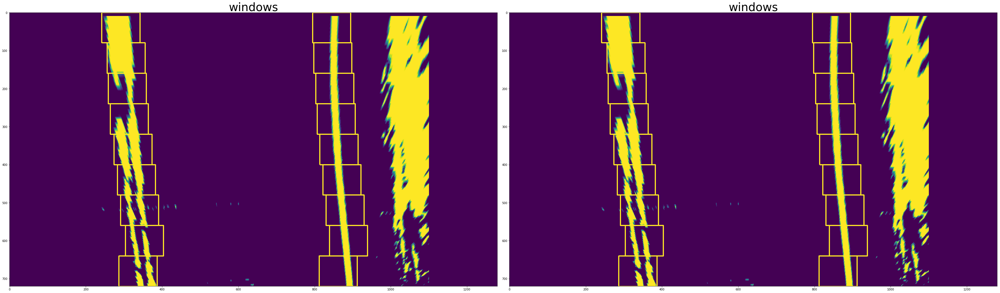

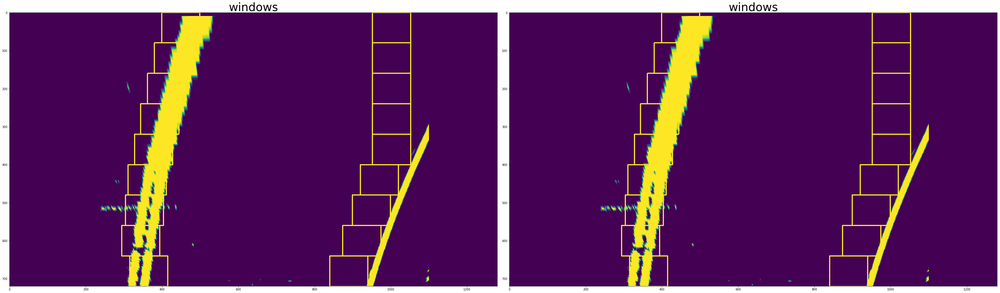

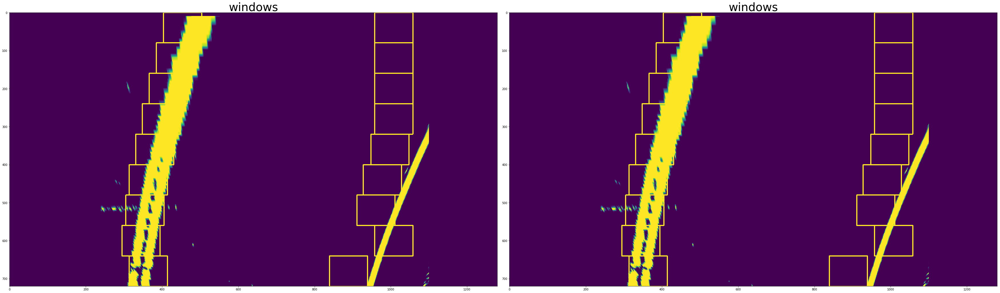

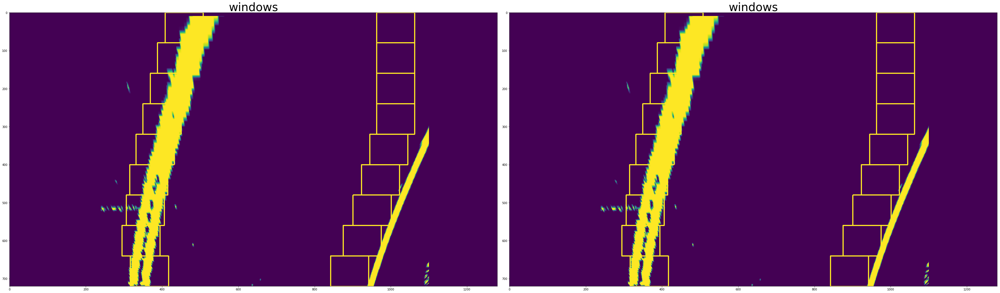

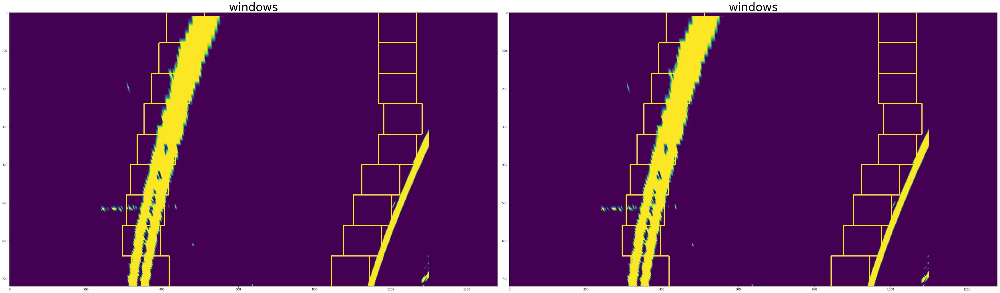

...

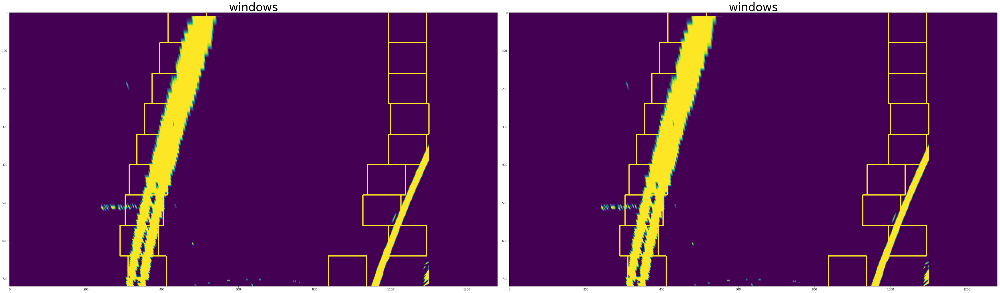

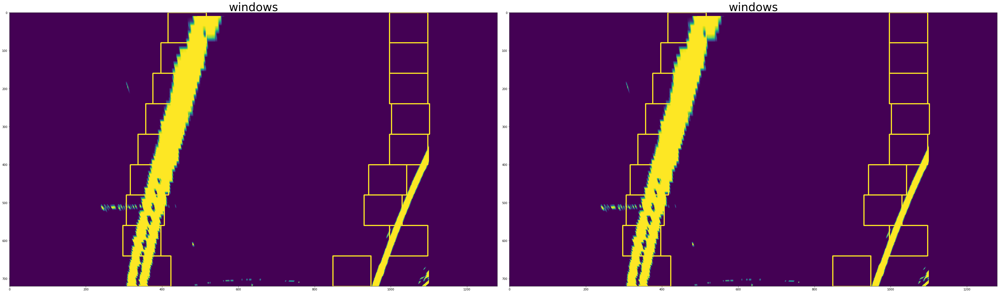

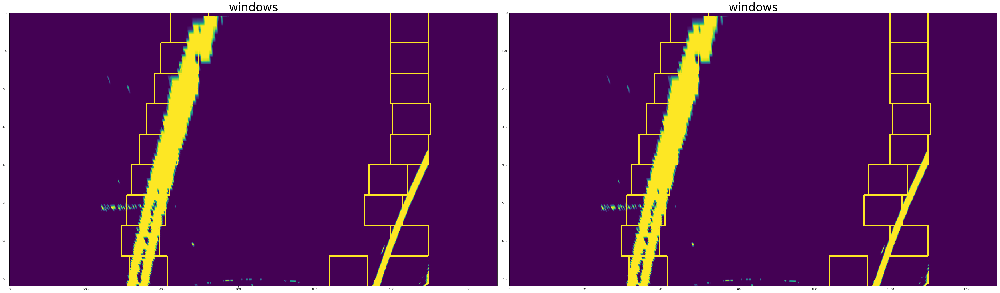

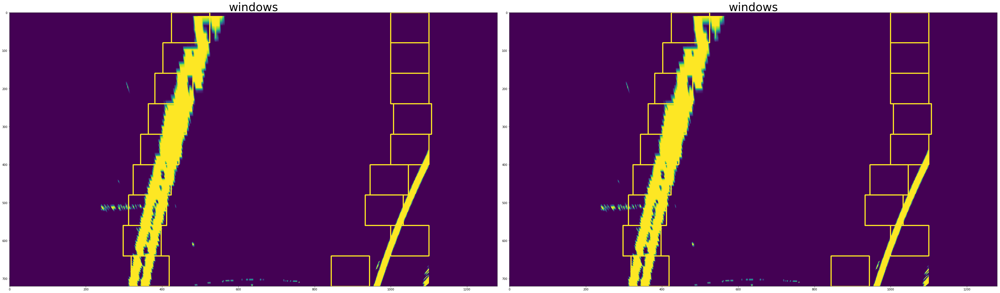

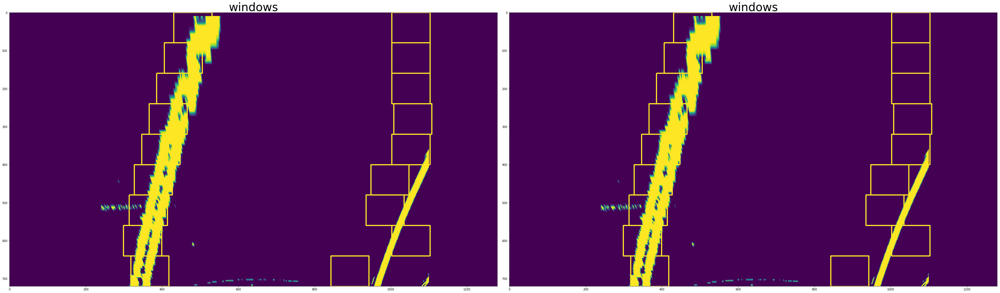

In [20]:
lanes = lines(0)

temp = 1

def process_image(image):
    if temp == 1:
        image = cv2.resize(image, (1280, 720))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        #unwraped = corners_unwarp(image, objpoints, imgpoints)
        image = exposure.adjust_gamma(image, 0.8)
        res2 = binary_road(image)
        #res2 = np.dstack((res2, res2, res2))
        res2 = corners_unwarp(res2, objpoints, imgpoints)
        res1, c,d = lanes.search_around_poly(res2)
        res1 = corners_warp(res1, objpoints, imgpoints)
        result = cv2.addWeighted(image, 1, res1, 0.2, 0)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, c,(10,100), font, 2, (200,255,155), 2, cv2.LINE_AA)
        cv2.putText(result, d,(10,200), font, 2, (200,255,155), 2, cv2.LINE_AA)
        
        
        
    else:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        #unwraped = corners_unwarp(image, objpoints, imgpoints)
        image = exposure.adjust_gamma(image, 2)
        result = binary_road(image)
        result = np.dstack((result, result, result))
    return result

white_output = '1harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,1)
clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(5,7)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

In [21]:
HTML("""
<video width="960" height="540" controls>2602413
  <source src="{0}">
</video>
""".format(white_output))